# Keeping Scooters below 340 per sq. mile

### Findings:
1. Downtown Nashville contains the highest density of scooters
1. Only Bird scooters have violated the clustering rule between 7/20/2019 to 9/15/2019
1. Based on our sampling, 37 of 1334 (2%) time periods had at least one square mile with > 340 bird scooters
1. There is reason to believe the extracts are understating bird's scooter count. 
1. Using a second extact method, 14 of 50 time segments between 9-24 and 9-28 (28%) produced square miles with > 340 bird scooters, centered around downtown.


# Only bird scooters have violated the clustering rule between 7/20/2019 to 9/15/2019

### Package import

In [377]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import json
import folium
from datetime import datetime
from pytz import timezone
import sqlite3


from IPython.core.display import HTML

pd.set_option('display.float_format', '{:.4f}'.format)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

### Helper function to save folium maps - this is helpful for complex maps

In [ ]:
def embed_map(m, name="index"):
    ''' 
        Helper function to assist with mapping
        This has been helpful for generating maps in jupyter notebook
    '''
    from IPython.display import IFrame
    if name=="index":
        m.save('index.html')
        return IFrame('index.html', width='100%', height='750px')
    else:
        m.save('{}.html'.format(name))
        return IFrame('{}.html'.format(name), width='100%', height='750px')

### Clean the extract data to remove bad data

In [42]:
fmt = '%Y-%m-%d %H:%M:%S'

nash_districts = gpd.read_file('council_districts.geojson',crs={'init': 'epsg:4326'})
nash_census_tracts = gpd.read_file('davidson_county_census_tracts.geojson')
nash_census_tracts = nash_census_tracts.to_crs({'init': 'epsg:4326'})

def cleanse_scooters(gdf):
    """
        Input: geodataframe with Nashville Scooter Data
        Output: same geodatafame minus
                - anything outside of Nashville (within Nashville census tracts only)
                - excluding impossibly long or short availabilities
    """
    
    # important to recalculate the availability duration from the scooter_master data
    gdf['availability_start_datetime_cst'] = gdf['availability_start_date_cst'] + ' ' + gdf['availability_start_time_cst']
    gdf['extract_datetime_cst'] = gdf['extract_date_cst'] + ' ' + gdf['extract_time_cst']
    gdf['availability_duration_seconds'] = gdf.apply(lambda x: (datetime.strptime(x['extract_datetime_cst'],fmt)-datetime.strptime(x['availability_start_datetime_cst'],fmt)).total_seconds(),axis=1)
    gdf['availability_hours'] = round(gdf['availability_duration_seconds']/60/60,2)
    
    
    new_gdf = gpd.sjoin(gdf,nash_districts[['geometry','district']],op='within')
    new_gdf.drop('index_right', axis=1, inplace=True)
    
    # tag with census track number
    new_gdf = gpd.sjoin(new_gdf,nash_census_tracts[['geometry','TRACTCE']],op='within')
    new_gdf.drop('index_right', axis=1, inplace=True)
    

    # availability outside of possibility and within Davidson county
    gdf = new_gdf[(new_gdf['availability_duration_seconds']<259200) & (new_gdf['availability_duration_seconds']>=0) & (new_gdf['district']!='')].copy()

    return gdf

def get_scooter_companies():
    """
    Returns a list of the scooter company objects
    """
    lime = {'company':'lime','endpoint':'https://data.nashville.gov/resource/ntar-zcjt.json?','color':'lime','timezone':'UTC'}
    bird = {'company': 'bird','endpoint':'https://data.nashville.gov/resource/nar3-8j89.json?','color': 'black','timezone':'UTC'}
    uber = {'company':'uber','endpoint':'https://data.nashville.gov/resource/jwwr-v4rf.json?','color': 'red','timezone':'UTC'}
    lyft = {'company':'lyft','endpoint':'https://data.nashville.gov/resource/bmb2-fucd.json?', 'color': 'pink','timezone':'UTC'}
    gotcha = {'company': 'gotcha','endpoint':'https://data.nashville.gov/resource/anqi-zsnc.json?','color': 'aqua','timezone':'UTC'}
    spin = {'company':'spin','endpoint':'https://data.nashville.gov/resource/2gne-qgxz.json?','color': 'orange','timezone':'UTC'}
    bolt = {'company':'bolt','endpoint':'https://data.nashville.gov/resource/rxpd-ez2h.json?','color': 'yellow','timezone':'UTC'}

    # bolt data lat and long is inaccurate
    #[uber, lyft, gotcha, spin, bolt,lime, bird]
    return [uber, lyft, gotcha, spin, bolt,lime, bird]

scooter_companies = get_scooter_companies()
color_coding = dict(zip([x['company'] for x in scooter_companies], [x['color'] for x in scooter_companies]))

## Census tract 19500 represents Nashville downtown. It is consistently the area with the highest density of scooters

### Work through an example using the extact with the largest number of 'parked' scooters

In [38]:
# top 1 most populated datetime - to illustrate where are scooters clustered (by census tract)?

sql = 'SELECT * from scooters WHERE extract_date_cst || " " || extract_time_cst == "2019-08-19 11:00:08"'

conn= sqlite3.connect("./scooter_db/scooters_archive.db")
largest_extract = pd.read_sql(sql,conn)
conn.commit()
conn.close()

largest_extract_gdf = gpd.GeoDataFrame(largest_extract, geometry=gpd.points_from_xy(largest_extract.gps_longitude, largest_extract.gps_latitude),crs={'init': 'epsg:4326'}) 
largest_extract_gdf = cleanse_scooters(largest_extract_gdf)
largest_extract_gdf.head()

,availability_duration,availability_start_date,availability_start_time,company_name,company_phone,company_website,gps_latitude,gps_longitude,real_time_fare,sumd_group,sumd_id,sumd_type,availability_start_date_cst,availability_start_time_cst,availability_duration_seconds,extract_date_cst,extract_time_cst,extract_date_utc,extract_time_utc,geometry,availability_start_datetime_cst,extract_datetime_cst,availability_hours,district,TRACTCE
211,2500.724496764,2019-08-19,15:16:00,bird,https://www.bird.co,1-866-205-2442,36.1440,-86.8418,15,scooter,Powered 1I5F3,Powered,2019-08-19,10:16:00,2648.0000,2019-08-19,11:00:08,2019-08-19,16:00:08,POINT (-86.841775 36.144005),2019-08-19 10:16:00,2019-08-19 11:00:08,0.7400,24,013400
339,2499.838173793,2019-08-19,15:16:01,bird,https://www.bird.co,1-866-205-2442,36.1440,-86.8418,15,scooter,Powered 944EN,Powered,2019-08-19,10:16:01,2647.0000,2019-08-19,11:00:08,2019-08-19,16:00:08,POINT (-86.841775 36.144005),2019-08-19 10:16:01,2019-08-19 11:00:08,0.7400,24,013400
442,2500.764432663,2019-08-19,15:16:00,bird,https://www.bird.co,1-866-205-2442,36.1439,-86.8419,15,scooter,Powered F8GJP,Powered,2019-08-19,10:16:00,2648.0000,2019-08-19,11:00:08,2019-08-19,16:00:08,POINT (-86.841886 36.143945),2019-08-19 10:16:00,2019-08-19 11:00:08,0.7400,24,013400
482,1763.627573902,2019-08-19,15:28:17,bird,https://www.bird.co,1-866-205-2442,36.1526,-86.8362,15,scooter,Powered I7EUA,Powered,2019-08-19,10:28:17,1911.0000,2019-08-19,11:00:08,2019-08-19,16:00:08,POINT (-86.836175 36.152588),2019-08-19 10:28:17,2019-08-19 11:00:08,0.5300,24,013400
621,1763.686834563,2019-08-19,15:28:17,bird,https://www.bird.co,1-866-205-2442,36.1524,-86.8362,15,scooter,Powered S14EF,Powered,2019-08-19,10:28:17,1911.0000,2019-08-19,11:00:08,2019-08-19,16:00:08,POINT (-86.836185 36.152434),2019-08-19 10:28:17,2019-08-19 11:00:08,0.5300,24,013400


### Scooters density is highest in the census tract representing downtown, with West End/Vanderbilt being the next most dense area.

In [40]:
largest_extract_gdf.groupby('TRACTCE')['sumd_id'].size().sort_values(ascending=False).head(5)

TRACTCE
019500    833
016500    149
017200    119
016400     42
016600     40
Name: sumd_id, dtype: int64

In [378]:
m = folium.Map(location=(36.1572432,-86.7814636),tiles='Stamen Toner',zoom_start=14)

folium.GeoJson(nash_census_tracts.query('(TRACTCE=="019500")').geometry,
              style_function=lambda feature: {
                'fillColor': 'red',
                'color' : 'red',
                'weight' : 2,
                'fillOpacity' : .25,
                }).add_to(m)

folium.GeoJson(nash_census_tracts.query('(TRACTCE=="016500")').geometry,
              style_function=lambda feature: {
                'fillColor': 'orange',
                'color' : 'orange',
                'weight' : 2,
                'fillOpacity' : .25,
                }).add_to(m)



for r in largest_extract_gdf.iterrows():
    c += 1
    row = r[1]
    folium.Circle(
        radius=25,
        location=[row['gps_latitude'],row['gps_longitude']],
        popup = '<div>' + str(row['gps_latitude']) + ', ' + str(row['gps_longitude']) + '</div>',
        color='black',
        fill=False,
    ).add_to(m)

HTML(m._repr_html_())

## How many scooters in a square mile?

1. Introduce a function for calculating a sq mile bounding box from a point
2. Confirm it does what we expect

In [136]:
import pyproj
import json
from shapely.geometry import Point, mapping
from functools import partial
from shapely.ops import transform
from shapely.geometry import Polygon

def bounding_box_around_point(point):
    """
        Method to take central point and return a polygon representing 1 square mile around a point
        Adapted from: https://gis.stackexchange.com/questions/268250/generating-polygon-representing-rough-100km-circle-around-latitude-longitude-poi
    """
    local_azimuthal_projection = f"+proj=aeqd +R=6371000 +units=m +lat_0={point.y} +lon_0={point.x}"

    wgs84_to_aeqd = partial(
        pyproj.transform,
        pyproj.Proj('+proj=longlat +datum=WGS84 +no_defs'),
        pyproj.Proj(local_azimuthal_projection),
    )

    aeqd_to_wgs84 = partial(
        pyproj.transform,
        pyproj.Proj(local_azimuthal_projection),
        pyproj.Proj('+proj=longlat +datum=WGS84 +no_defs'),
    )

    point_transformed = transform(wgs84_to_aeqd, point)

    buffer = point_transformed.buffer(804.59) # buffer which will result in a square mile

    buffer_wgs84 = transform(aeqd_to_wgs84, buffer)
 
    sq_mile_poly = Polygon(buffer_wgs84.envelope).exterior.coords.xy
    x = sq_mile_poly[0].tolist()
    y = sq_mile_poly[1].tolist()
    selection_poly = Polygon(list(zip(x,y)))
    
    return selection_poly


In [255]:
# check that box is sq mile
poly = bounding_box_around_point(Point(-86.777425,36.160967))

geom_aea = transform(
    partial(
        pyproj.transform,
        pyproj.Proj(init='EPSG:4326'),
        pyproj.Proj(
            proj='aea',
            lat_1=poly.bounds[1],
            lat_2=poly.bounds[3])),
poly)

print(geom_aea.area/2590000) # sqmiles
# 0.9999808505876449 slightly smaller than a square mile - but very, very close

0.9999808505876449


### Plot the sq mile polygon to illustrate how big a square mile is:

In [379]:
m = folium.Map(location=(36.160967,-86.777425),tiles='Stamen Toner',zoom_start=14)

folium.GeoJson(json.dumps(mapping(poly))).add_to(m)

# center point
folium.Circle(
        radius=50,
        location=[36.160967,-86.777425],
        color='black',
        fill=False,
    ).add_to(m)

# largest extract
for r in largest_extract_gdf.iterrows():
    c += 1
    row = r[1]
    folium.Circle(
        radius=25,
        location=[row['gps_latitude'],row['gps_longitude']],
        popup = '<div>' + str(row['gps_latitude']) + ', ' + str(row['gps_longitude']) + '</div>',
        color='black',
        fill=False,
    ).add_to(m)


HTML(m._repr_html_())

### Focus on top of the hour extracts
This is to reduce the time to process, there is nothing special about 'top of the hour' time periods

#### This analysis will focus on 1,334 time periods

In [156]:
# sample the history - get the top of the hour extracts
conn= sqlite3.connect("./scooter_db/scooters_master.db")
df_dates = pd.read_sql('select * from extract_schedule',conn)
conn.commit()
conn.close()

FMT = '%Y-%m-%d %H:%M:%S'
df_dates['datetime_to_hour'] = df_dates.apply(lambda x: datetime.strptime(x['extract_datetime_cst'],FMT).replace(microsecond=0,second=0,minute=0),axis=1)
df_dates_hours = df_dates.groupby('datetime_to_hour')['extract_datetime_cst'].min().reset_index()
print('number of hours: ', len(df_dates_hours))
df_dates_hours.head()

number of hours:  1334


,datetime_to_hour,extract_datetime_cst
0,2019-07-20 09:00:00,2019-07-20 09:06:39
1,2019-07-20 10:00:00,2019-07-20 10:00:02
2,2019-07-20 11:00:00,2019-07-20 11:00:02
3,2019-07-20 12:00:00,2019-07-20 12:00:02
4,2019-07-20 13:00:00,2019-07-20 13:00:02


### Process:
1. Focus on two tracts: downtown and west end
1. Loop through each time period and randomly sample 10 points
1. Draw a sq mile around the point and count the scooters within
1. Capture coordinates and time periods with > 300 for any company inside the square, we'll filter for 340 later
    

#### Capture out of bounds records

In [195]:
import random
import time
from statistics import mean 

out_of_compliance = []
times = []

for d in df_dates_hours[:].iterrows():
    
    starttime = time.time()

    date_row = d[1]
    selected_date = date_row['extract_datetime_cst']

    conn= sqlite3.connect("./scooter_db/scooters_master.db")
    df = pd.read_sql("select * from scooters where '{}' between first_extract_date_cst || ' ' || first_extract_time_cst and extract_date_cst || ' ' || extract_time_cst".format(selected_date),conn)
    conn.commit()
    conn.close()
    
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.gps_longitude, df.gps_latitude),crs={'init': 'epsg:4326'})
    gdf = cleanse_scooters(gdf)
    
    tracts = ['019500','016500']

    for tract in tracts:

        dataset = gdf.query('TRACTCE=="{}"'.format(tract))
        random_set = random.sample(range(0, len(dataset)), 10)

        for r in dataset.iloc[random_set].iterrows():

            row = r[1]

            lat = row['gps_latitude']
            lon = row['gps_longitude']

            point = Point(lon,lat)
            selection_poly = bounding_box_around_point(point)

            gdf['in_poly'] = gdf.apply(lambda x: x['geometry'].within(selection_poly), axis = 1)
            in_poly_df = gdf.query('in_poly==True').groupby(['company_name']).size()

            if (in_poly_df > 300).any(): 
                in_poly_df = in_poly_df.reset_index()
                in_poly_df.columns = ['company_name','count']
                in_poly_df['selected_datetime'] = selected_date
                in_poly_df['polygon'] =  selection_poly
                out_of_compliance.append(in_poly_df)
    
    times.append(time.time() - starttime)

print(mean(times))
out_of_bounds_df = pd.concat(out_of_compliance)
out_of_bounds_df.to_csv('out_of_bounds.csv',index=False)
out_of_bounds_df.head(10)

2.0208887885892945


,company_name,count,selected_datetime,polygon
0,bird,303,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
1,lime,69,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
2,lyft,90,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
3,spin,114,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
4,uber,83,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
0,bird,329,2019-07-27 15:00:02,POLYGON ((-86.78989085054961 36.14950714829094...
1,lime,72,2019-07-27 15:00:02,POLYGON ((-86.78989085054961 36.14950714829094...
2,lyft,109,2019-07-27 15:00:02,POLYGON ((-86.78989085054961 36.14950714829094...
3,spin,146,2019-07-27 15:00:02,POLYGON ((-86.78989085054961 36.14950714829094...
4,uber,97,2019-07-27 15:00:02,POLYGON ((-86.78989085054961 36.14950714829094...


### Reviewing the 'out of bounds' records

In [223]:
from shapely import wkt

out_of_bounds_gdf = gpd.read_file('out_of_bounds.csv')
out_of_bounds_gdf.crs = {'init': 'epsg:4326'}
# fix datatypes
out_of_bounds_gdf['count'] = out_of_bounds_gdf['count'].astype('int')
out_of_bounds_gdf['geometry'] = out_of_bounds_gdf['polygon'].apply(wkt.loads)
out_of_bounds_gdf = gpd.GeoDataFrame(out_of_bounds_gdf, geometry='geometry')
out_of_bounds_gdf = out_of_bounds_gdf.drop(['polygon'],axis=1)
out_of_bounds_gdf.head()

,company_name,count,selected_datetime,geometry
0,bird,303,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
1,lime,69,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
2,lyft,90,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
3,spin,114,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...
4,uber,83,2019-07-27 15:00:02,POLYGON ((-86.78484757667393 36.15585914829095...


#### Something is going on with Bird

In [365]:
out_of_bounds_gdf.groupby('company_name')['count'].sum()

company_name
bird    142536
lime     32812
lyft     36387
spin     44529
uber     28408
Name: count, dtype: int64

#### When we limit to only those > 340, only Bird shows up

In [358]:
top_counts_gdf = out_of_bounds_gdf.query('count>340').copy()
top_counts_gdf.crs = {'init': 'epsg:4326'}
print(top_counts_gdf['company_name'].unique())
top_counts_gdf.head()

['bird']


,company_name,count,selected_datetime,geometry
195,bird,350,2019-08-01 11:00:08,POLYGON ((-86.78635310955963 36.15177314829093...
205,bird,344,2019-08-01 11:00:08,POLYGON ((-86.78597930892336 36.15351714829094...
350,bird,343,2019-08-02 20:00:08,POLYGON ((-86.78826845445602 36.15479014829094...
355,bird,352,2019-08-02 20:00:08,"POLYGON ((-86.7838664617729 36.15485414829094,..."
360,bird,352,2019-08-02 20:00:08,POLYGON ((-86.78385837591526 36.15410314829094...


#### Select the time/sq mile with most scooters. 

In [359]:
idx = top_counts_gdf.groupby(['selected_datetime'])['count'].transform(max) == top_counts_gdf['count']
print(len(top_counts_gdf[idx]))
top_counts_gdf[idx].head()

37


,company_name,count,selected_datetime,geometry
195,bird,350,2019-08-01 11:00:08,POLYGON ((-86.78635310955963 36.15177314829093...
355,bird,352,2019-08-02 20:00:08,"POLYGON ((-86.7838664617729 36.15485414829094,..."
360,bird,352,2019-08-02 20:00:08,POLYGON ((-86.78385837591526 36.15410314829094...
400,bird,367,2019-08-02 21:00:08,POLYGON ((-86.78779926742594 36.15315414829093...
415,bird,359,2019-08-03 10:00:08,POLYGON ((-86.78583777439667 36.15234034829093...


## Based on our sample 37 time periods of 1,334 had > 340 scooters (2.7% of time periods)

## Visualize which square miles have the most bird scooters?
Each square represents an area with > 340 scooters. None are outside core downtown area.

In [380]:
m = folium.Map(location=(36.153641,-86.78615),tiles='Stamen Toner',zoom_start=14)

colors = []

from random import randint

# randomly assign each polygon a color so that we can differentiate them
for i in range(len(top_counts_gdf)):
    colors.append('%06X' % randint(0, 0xFFFFFF))
    
top_counts_gdf['RGBA'] = ['#' + c for c in colors]


folium.GeoJson(
    top_counts_gdf.iloc[:],
    style_function=lambda feature: {
#         'fillColor': 0,
        'color' : feature['properties']['RGBA'],
        'weight' : 2,
        'fillOpacity' : 0,
        }
    ).add_to(m)

HTML(m._repr_html_())

## Using another source for accurate count of bird scooters

### Compare data extracts from data.nashville.gov against Bird API
Based on: https://github.com/ubahnverleih/WoBike/blob/master/Bird.md

#### Library for static maps

In [228]:
import contextily as ctx

def add_basemap(ax, zoom, url='http://tile.stamen.com/toner-lite/tileZ/tileX/tileY.png'):
    # url='http://tile.stamen.com/terrain/tileZ/tileX/tileY.png'
    # ctx.providers.Stamen.TonerLite
    xmin, xmax, ymin, ymax = ax.axis()
    basemap, extent = ctx.bounds2img(xmin, ymin, xmax, ymax, zoom=zoom, url=url)
    ax.imshow(basemap, extent=extent, interpolation='bilinear')
    # restore original x/y limits
    ax.axis((xmin, xmax, ymin, ymax))

### Capture data for a time period where we know there > 340 bird scooters in a square mile

In [355]:
selected_date = '2019-09-24 10:00:12'

# normal scooter extract occurred 3 seconds earlier
extract_selected_date = '2019-09-24 10:00:09'

conn= sqlite3.connect("../../workspace/scooters/scooters.db")

df = pd.read_sql("select * from scooters where extract_date_cst || ' ' || extract_time_cst = '{}'".format(extract_selected_date),conn)
conn.commit()
conn.close()

selection_poly = Polygon(top_counts_gdf.iloc[0].geometry)

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.gps_longitude, df.gps_latitude),crs={'init': 'epsg:4326'})
gdf['in_poly'] = gdf.apply(lambda x: x['geometry'].within(selection_poly), axis = 1)
gdf = gdf.to_crs(epsg=3857)


conn= sqlite3.connect("../../workspace/scooters/bird.db")
df = pd.read_sql("select * from bird_extracts where '{}' = extract_datetime".format(selected_date),conn)
conn.commit()
conn.close()
gdf_bird = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude),crs={'init': 'epsg:4326'})
gdf_bird['in_poly'] = gdf_bird.apply(lambda x: x['geometry'].within(selection_poly), axis = 1)
gdf_bird = gdf_bird.to_crs(epsg=3857)


# create a geodataframe from the poly
record = [{'geometry':selection_poly}]
df_temp = pd.DataFrame.from_dict(record)
gdf_poly = gpd.GeoDataFrame(df_temp,geometry=df_temp['geometry'],crs={'init': 'epsg:4326'})
gdf_poly = gdf_poly.to_crs(epsg=3857)

## Nashville data vs Bird API
#### In the figure below the black circles represent bird scooters, the blue dots represent bird scooters from the extract.
There are a few wayward points, but for the most part the blue dots align with the black circles. However, there are large number of circles with no blue circle nearby. This made me question whether or not bird is publishing all of the data to Nashville.

#### Interesting coincidence, 9-24 is the last time https://data.nashville.gov/ received data from Bird.

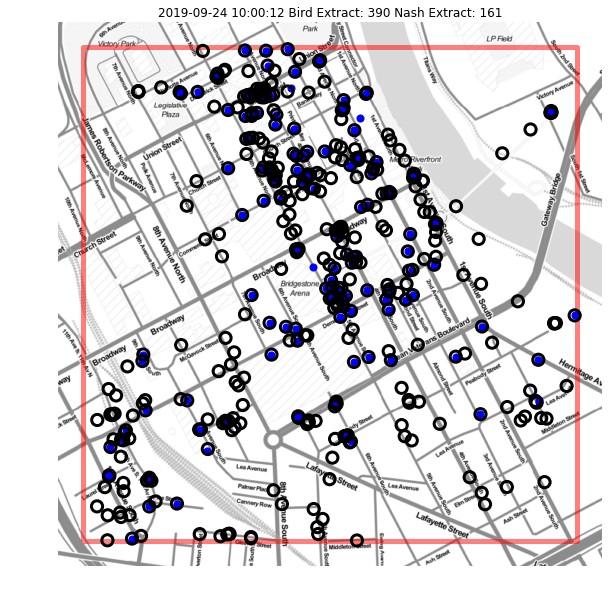

In [356]:
fig, ax = plt.subplots(figsize=(10, 10))
gdf_poly.plot(figsize=(10, 10), alpha=0.5, edgecolor='r',ax=ax, facecolor='none',linewidth=5)
add_basemap(ax,zoom=16)

gdf.query('(in_poly==True) and (company_name=="bird")').plot(figsize=(10, 10), ax=ax, facecolors='b', edgecolors='b', markersize=50)
gdf_bird.query('in_poly==True').plot(figsize=(10, 10), ax=ax, facecolors='none', edgecolors='k', markersize=125,linewidth=3)

# plt.scatter(gdf_temp['gps_longitude'], gdf_temp['gps_latitude'], s=5, c='blue', alpha=0.5)
ax.set_axis_off()
len_extract_bird = len(gdf.query('(in_poly==True) and (company_name=="bird")'))
title = f'{selected_date} Bird Extract: {len(gdf_bird.query("in_poly==True"))} Nash Extract: {len_extract_bird}'
ax.set_title(title)

plt.savefig(selected_date[:10] + '.png',bbox_inches='tight')
plt.show()

### I started collecting scooters from bird api begining 9-24

In [367]:
gdf_birds = gpd.read_file('out_of_bounds_birds.csv')
gdf_birds.crs = {'init': 'epsg:4326'}
# fix datatypes
gdf_birds['count'] = gdf_birds['count'].astype('int')
gdf_birds['geometry'] = gdf_birds['polygon'].apply(wkt.loads)
gdf_birds = gpd.GeoDataFrame(gdf_birds, geometry='geometry')
gdf_birds = gdf_birds.drop(['polygon'],axis=1)
gdf_birds.head()

,id,count,selected_datetime,geometry
0,2019-09-24 09:00:10,353,2019-09-24 09:00:10,POLYGON ((-86.78350910030061 36.15169214829095...
1,2019-09-24 09:00:10,345,2019-09-24 09:00:10,POLYGON ((-86.78423291821403 36.15009914829094...
2,2019-09-24 10:00:12,388,2019-09-24 10:00:12,POLYGON ((-86.78637109469949 36.15164314829094...
3,2019-09-24 10:00:12,371,2019-09-24 10:00:12,POLYGON ((-86.79028023587468 36.15287814829094...
4,2019-09-24 10:00:12,397,2019-09-24 10:00:12,POLYGON ((-86.78252023415995 36.15286314829095...


## 14 of 50 time periods had sq miles with > 340 bird scooters, which suggest bird is violating the clustering rule more often than the data.nashville data suggests


In [368]:
bird_idx = gdf_birds.groupby(['selected_datetime'])['count'].transform(max) == gdf_birds['count']
print(len(gdf_birds[bird_idx]))
gdf_birds[bird_idx].head()

14


,id,count,selected_datetime,geometry
0,2019-09-24 09:00:10,353,2019-09-24 09:00:10,POLYGON ((-86.78350910030061 36.15169214829095...
7,2019-09-24 10:00:12,412,2019-09-24 10:00:12,POLYGON ((-86.78598603308808 36.15110414829094...
12,2019-09-24 12:00:13,406,2019-09-24 12:00:13,POLYGON ((-86.78541521644114 36.15270814829095...
14,2019-09-24 14:00:08,382,2019-09-24 14:00:08,POLYGON ((-86.78362120992523 36.15265114829094...
20,2019-09-24 15:00:04,394,2019-09-24 15:00:04,POLYGON ((-86.78664299719647 36.15079014829094...


### Visualize instances of > 340 scooters (from Bird API)

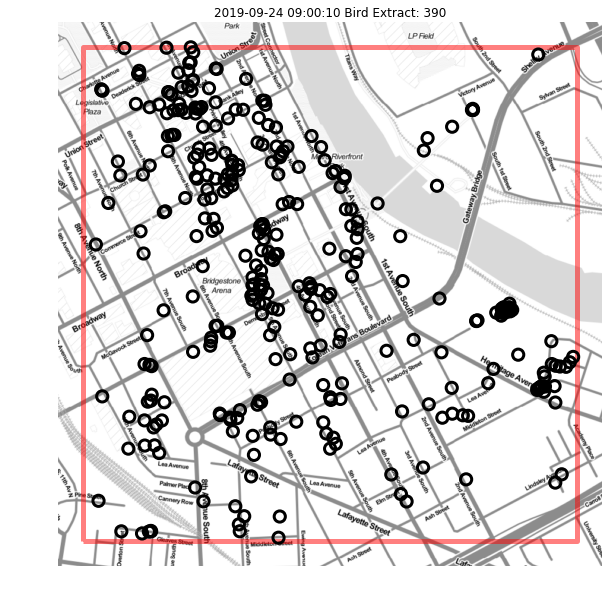

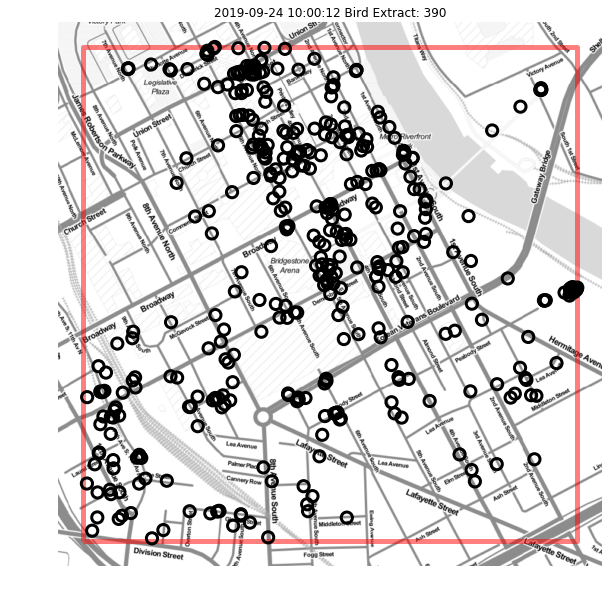

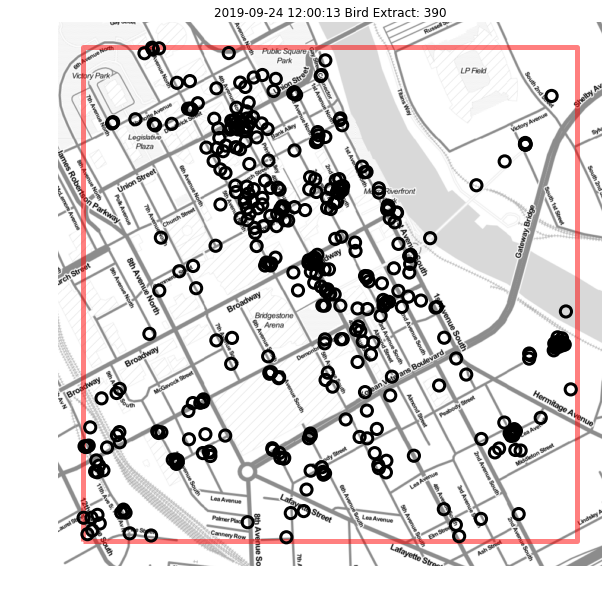

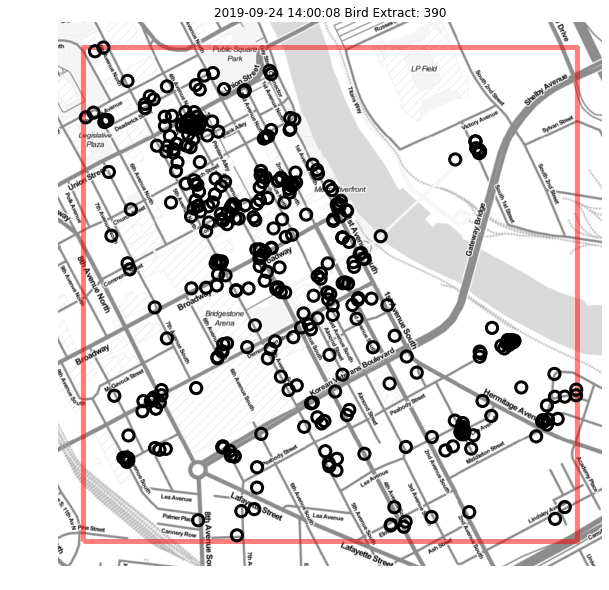

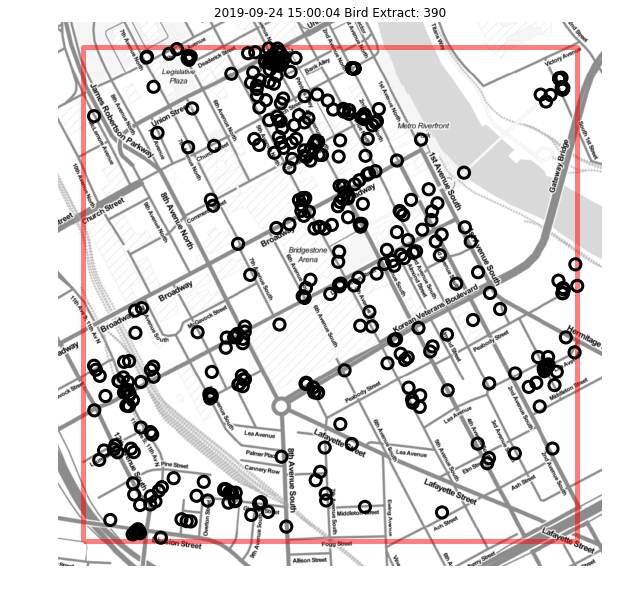

...

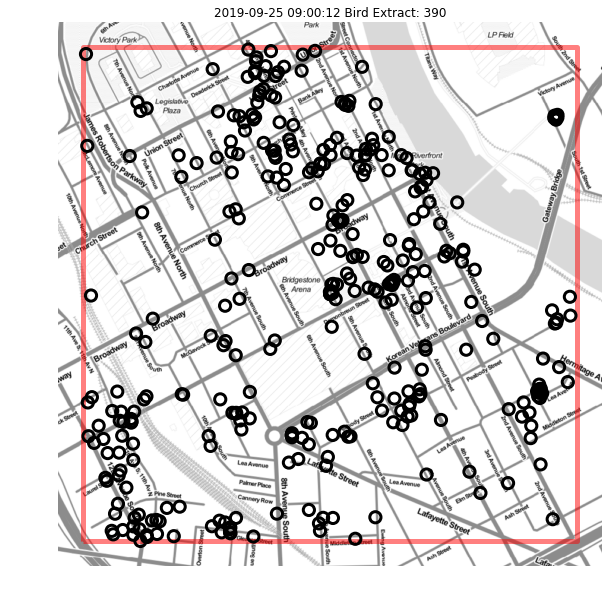

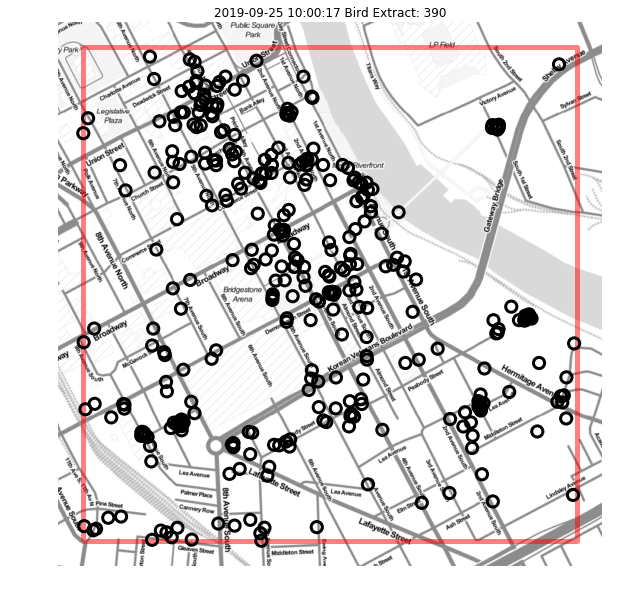

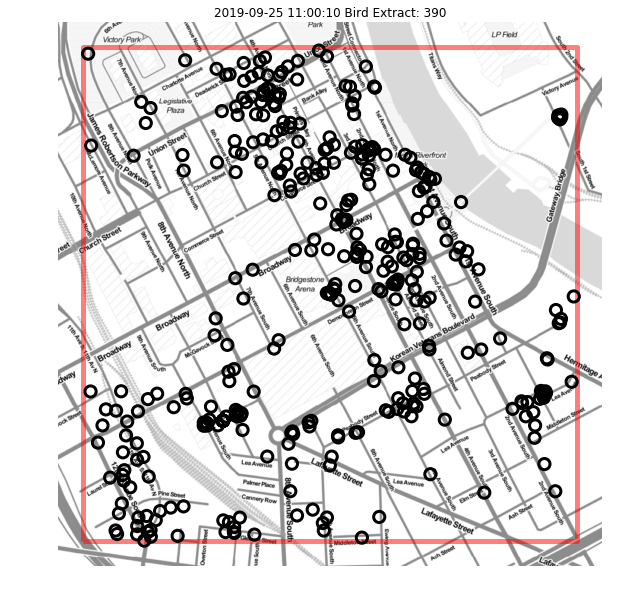

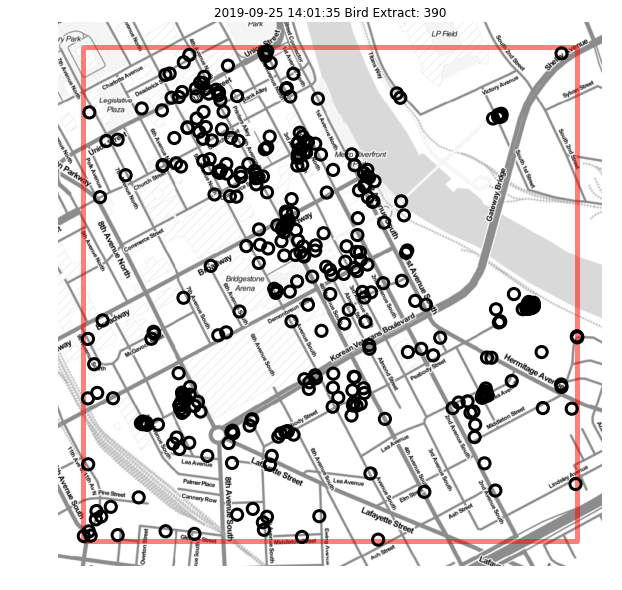

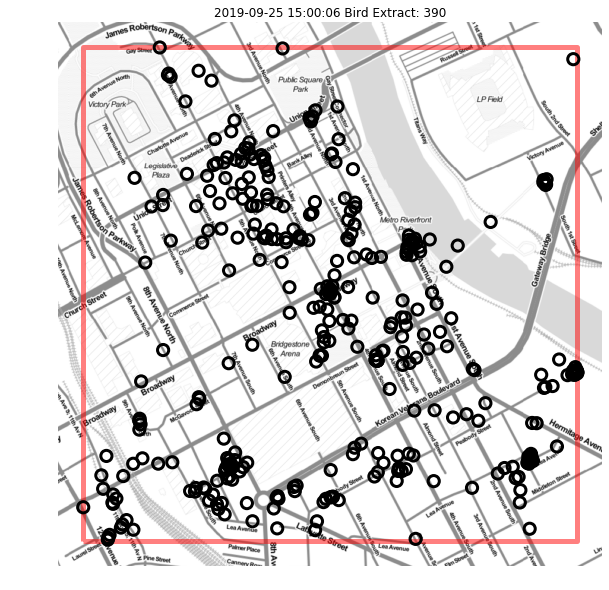

In [370]:
for r in gdf_birds[bird_idx].iloc[:].iterrows():
    
    row = r[1]
    
    selected_datetime = row['selected_datetime']
    selection_poly = row['geometry']
    
    record = [{'geometry':selection_poly}]
    df_temp = pd.DataFrame.from_dict(record)
    gdf_poly = gpd.GeoDataFrame(df_temp,geometry=df_temp['geometry'],crs={'init': 'epsg:4326'})
    gdf_poly = gdf_poly.to_crs(epsg=3857)

    # loop through and plot
    fig, ax = plt.subplots(figsize=(10, 10))
    
    gdf_poly.plot(figsize=(10, 10), alpha=0.5, edgecolor='r',ax=ax, facecolor='none',linewidth=5)

    add_basemap(ax,zoom=16)

    conn= sqlite3.connect("../../workspace/scooters/bird.db")
    df = pd.read_sql("select * from bird_extracts where '{}' = extract_datetime".format(selected_datetime),conn)
    conn.commit()
    conn.close()
        
    gdf_birds_selected = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude),crs={'init': 'epsg:4326'})
    gdf_birds_selected['in_poly'] = gdf_birds_selected.apply(lambda x: x['geometry'].within(selection_poly), axis = 1)
    gdf_birds_selected = gdf_birds_selected.to_crs(epsg=3857)

    gdf_birds_selected.query('in_poly==True').plot(figsize=(10, 10), ax=ax, facecolors='none', edgecolors='k', markersize=125,linewidth=3)

    title = f'{selected_datetime} Bird Extract: {len(gdf_bird.query("in_poly==True"))}'
    ax.set_title(title)
    ax.set_axis_off()
    
    # plt.savefig(selected_date[:10] + '.png',bbox_inches='tight')
    plt.show()

### Visualing one instance

In [381]:
m = folium.Map(location=(36.1572432,-86.7814636),tiles='Stamen Toner',zoom_start=14)

colors = ['red','orange','pink']


print(gdf_birds_selected.iloc[0]['extract_datetime'])


folium.GeoJson(gdf_poly.geometry).add_to(m)

c = 0
for r in gdf_birds_selected.query('in_poly==True').iterrows():
    row = r[1]
    c += 1
    
    if c > 200:
        color = colors[2]
    elif c > 100:
        color = colors[1]
    else:
        color = colors[0]
    
    folium.Circle(
        popup='<div>' + str(c) + '</div><div>' + str(row['latitude']) + ',' + str(row['longitude']) + '</div>',
        radius=25,
        location=[row['latitude'],row['longitude']],
        color=color,
        fill=False,
        titles='hello', attr="attribution"
    ).add_to(m)

HTML(m._repr_html_())

2019-09-25 15:00:06


### Cluster map illustrating one violating time period

In [382]:
from folium.plugins import MarkerCluster

print(gdf_birds_selected.iloc[0]['extract_datetime'])

cluster_map = folium.Map(location=[gdf_birds_selected.query('in_poly==True')['latitude'].mean(), 
     gdf_birds_selected.query('in_poly==True')['longitude'].mean()], 
     tiles='Stamen Toner',zoom_start=15)

folium.GeoJson(gdf_poly.geometry).add_to(cluster_map)

marker_cluster = MarkerCluster()

c = 0
for r in gdf_birds_selected.query('in_poly==True').iterrows():
    row = r[1]
    c += 1
    marker_cluster.add_child(folium.CircleMarker(
        location=[row['latitude'],row['longitude']],
        color='black',
        popup='<div>' + str(c) + '</div><div>' + str(row['latitude']) + ',' + str(row['longitude']) + '</div>',
        fill=True
        ))
    

cluster_map.add_child(marker_cluster)
HTML(cluster_map._repr_html_())

2019-09-25 15:00:06
